# Higher Degree Linear Regression Practice - Team Macro

## Imports + data collection and modification

### Importing necessary libraries

In [44]:
#general
import pandas as pd
import numpy as np
from datetime import datetime

#graphing
%matplotlib notebook
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

#Scikit learn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

### Collecting local data

In [25]:
#array of dataframes
fullData = []
var_names = []

Price

In [26]:
# getting file locally
price = pd.read_csv("Price.csv", skiprows=4)

# to np array
data = price.to_numpy(np.dtype(datetime, float))

# setting column names
Pricedf = pd.DataFrame(data, columns=["Date", "Price"])

# putting columns to their respective type
Pricedf["Date"] = pd.to_datetime(Pricedf["Date"])
Pricedf["Price"] = pd.to_numeric(Pricedf["Price"])

# interpolating data to fill dates
Pricedf = Pricedf.resample('D', on='Date').mean()
Pricedf = Pricedf.interpolate(method='linear', axis=0)

# appending to whole
fullData.append(Pricedf)

Withdrawls

In [27]:
# getting file locally
withd = pd.read_csv("Withdrawls.csv", skiprows=105, nrows=505, usecols=[0, 1])

# to np array
withd = withd.to_numpy()

# to datetime
for j in range(len(withd)):
    withd[j][0] = datetime.strptime(withd[j][0], '%b-%Y')
    
# getting the first two value
ready4df = withd[:, [0, 1]]

# converting to dataframe
withddf = pd.DataFrame(ready4df, columns=["Date", "Withdrawal"])

# interpolating data to fill dates
withddf["Withdrawal"] = pd.to_numeric(withddf["Withdrawal"])
withddf = withddf.resample('D', on='Date').mean()
withddf = withddf.interpolate(method='linear', axis=0)

# appending to whole
fullData.append(withddf)
var_names.append("Withdrawls")

Working storage

In [28]:
# getting file locally
stordf1 = pd.read_csv("CSVngStorage.csv", skiprows=2)

# to np array
stor = stordf1.to_numpy()

# to datetime
for j in range(len(stor)):
        stor[j][0] = datetime.strptime(stor[j][0], "%d-%b-%y")
        
# getting the first two value
ready4df = stor[:, [0, 1]]

# converting to dataframe
stordf = pd.DataFrame(ready4df, columns=["Date", "Storage"])

# interpolating data to fill dates
stordf["Storage"] = pd.to_numeric(stordf["Storage"])
stordf = stordf.resample('D', on='Date').mean()
stordf = stordf.interpolate(method='linear', axis=0)

# appending to whole
fullData.append(stordf)
var_names.append("Storage")

Temperature anomaly

In [29]:
temp_tempAnomdf = pd.read_csv("MonthlyTemp.csv", skiprows=4)
tempAnom = temp_tempAnomdf.to_numpy()

temp_ngData = tempAnom
temp_rows, temp_cols = temp_ngData.shape
temp_ngData2 = [0 for i in range(temp_rows)]

for j in range(len(temp_ngData)):
    temp = temp_ngData[j][0]
    temp = str(temp)
    month = int(float(temp[4:]))
    year = int(temp[:4])
    ready4date = str(month) + "/1/" + str(year)
    dates = datetime.strptime(ready4date, "%m/%d/%Y")
    temp_ngData2[j] = ([dates, temp_ngData[j][2]])
    
temp_ngData2 = np.array(temp_ngData2, dtype=object)

tempAnomdf = pd.DataFrame(temp_ngData2, columns=["Date", "Temp Anomaly"])

tempAnomdf["Temp Anomaly"] = pd.to_numeric(tempAnomdf["Temp Anomaly"])

tempAnomdf = tempAnomdf.resample('D', on='Date').mean()

tempAnomdf = tempAnomdf.interpolate(method='linear', axis=0)

fullData.append(tempAnomdf)
var_names.append("Temp Anom")

### concatenation of data

Dates are from 2011-02-01

In [30]:
data = np.array(fullData, dtype=object)
df = pd.concat(data, axis = "columns")
df = df.iloc[11323:14975, ]

In [31]:
train, test = train_test_split(df, test_size = .25, random_state = 0)

### Splitting data into sets and normalizing

In [32]:

y_train = train.loc[:,"Price"].to_numpy()
x_train = train.loc[:, train.columns != "Price"].to_numpy()
y_test = test.loc[:,"Price"].to_numpy()
x_test = test.loc[:, test.columns != "Price"].to_numpy()

Prepocessing data

In [33]:
scale = StandardScaler()
x_train = scale.fit_transform(x_train)
x_test = scale.fit_transform(x_test)
y_train = scale.fit_transform(y_train.reshape(-1, 1))
y_test = scale.fit_transform(y_test.reshape(-1, 1))

## Polynomial Model

### setting up polynomial features of linear regression

To achieve a polynomial linear regression, you need to insert a polynomial feature as the input argument to a linear regression

In [34]:
poly = PolynomialFeatures(degree = 4, include_bias = False)

Fit_transform pre-processes data for cleaner results; it recalibrates data to have mean = 0 and standard deviation = 1.  This process helps with gradient descent and calculations.
 

### Individual sets - visualization and error

I wanted to see how the algorithm was fitting each data set and how accurate that line was

Withdrawls 
MSE:  0.5896375809459933 
MAE:  0.5642887910382324


<IPython.core.display.Javascript object>


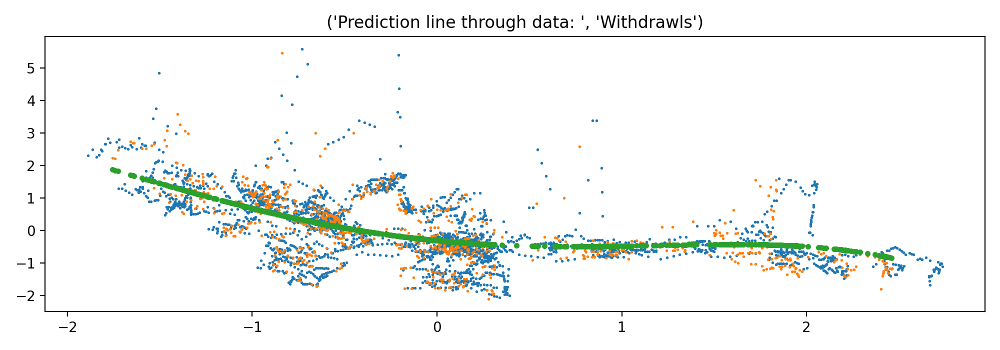

Storage 
MSE:  0.971943870499986 
MAE:  0.8048166470817775


<IPython.core.display.Javascript object>


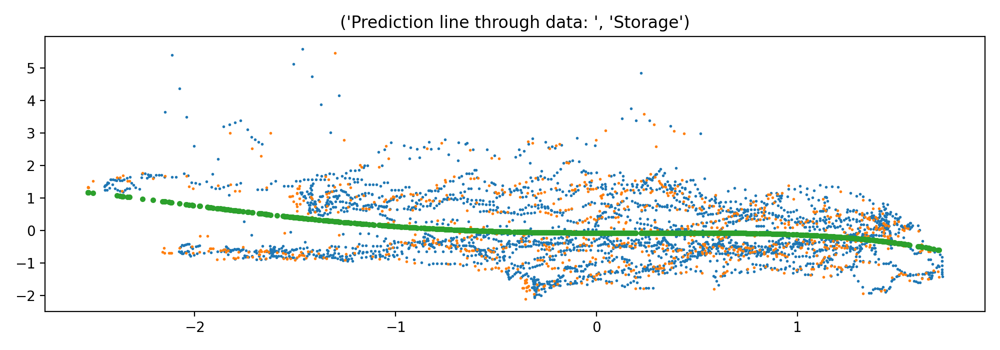

Temp Anom 
MSE:  0.8463377277110409 
MAE:  0.7382641246371416


<IPython.core.display.Javascript object>


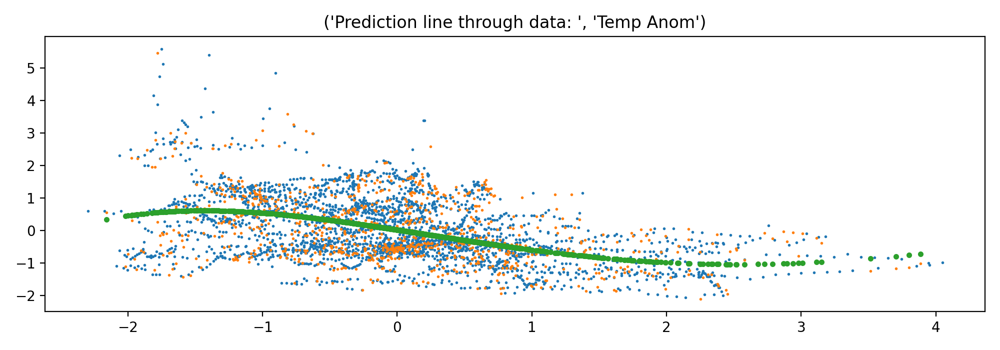

In [35]:
rows, cols = x_train.shape
temp_model = LinearRegression()
temp_poly = PolynomialFeatures(degree = 4, include_bias = False)

for i in range(cols):
    temp_x_train = x_train[:, i]
    temp_y_train = y_train
    temp_x_test = x_test[:, i]
    temp_y_test = y_test
    
    scale = StandardScaler()
    
    temp_x_train = scale.fit_transform(temp_x_train.reshape(-1, 1))
    temp_x_test = scale.fit_transform(temp_x_test.reshape(-1, 1))
    temp_y_train = scale.fit_transform(temp_y_train.reshape(-1, 1))
    temp_y_test = scale.fit_transform(temp_y_test.reshape(-1, 1))
    
    temp_x_poly = temp_poly.fit_transform(temp_x_train)
    temp_model.fit(temp_x_poly, temp_y_train)
    
    temp_y_predict = temp_model.predict(poly.fit_transform(temp_x_test))
    
    t_MSerror = mean_squared_error(temp_y_predict, temp_y_test)
    t_MAerror = mean_absolute_error(temp_y_predict, temp_y_test)
    
    print(var_names[i] , "\nMSE: " , t_MSerror , "\nMAE: " , t_MAerror)
    
    plt.figure()
    plt.scatter(temp_x_train, temp_y_train, s=1)
    plt.scatter(temp_x_test, temp_y_test, s=1)
    plt.scatter(temp_x_test, temp_y_predict, s=9)
    plt.title(("Prediction line through data: " , var_names[i]))
    plt.show()
    
    

## Polynomial features

In [36]:
x_poly = poly.fit_transform(x_train)

In [37]:
# poly.fit(x_train, y_train) -- Needed?  Code seems to work fine without it

### Running regression

In [38]:
model = LinearRegression()
model.fit(x_poly, y_train)

LinearRegression()

In [39]:
y_pred = model.predict(poly.fit_transform(x_test))

### Error

In [40]:
MSerror = mean_squared_error(y_pred, y_test)
MAerror = mean_absolute_error(y_pred, y_test)

print("MSE: " , MSerror , "\nMAE: " , MAerror)

MSE:  0.42135119340744803 
MAE:  0.5054123526344982


## Price calculation

In [41]:
y_total = np.concatenate((y_test, y_train))
x_total = np.concatenate((x_test, x_train))
yt_pred = model.predict(poly.fit_transform(x_total))

### Visualization of price prediction vs actual 2011-2021

Red = actual : Blue = predicted
x axis = days since 2011
y axis is not real price, it's rescaled to match the algorithm's predictions.  I'm working on a way for it to reflect the real price, however, the algorithm's accuracy is still represented.

In [42]:
plt.figure(figsize=(200, 10), dpi=80)
plt.rcParams["figure.figsize"] = [10, 3.50]
plt.rcParams["figure.autolayout"] = True
plt.plot(range(1, len(y_total)+1), y_total, c='red')
plt.plot(range(1, len(yt_pred)+1), yt_pred)

plt.show()

<IPython.core.display.Javascript object>

### Error of price prediction
Ultamite indicator of accuracy

In [43]:
MSerror = mean_squared_error(yt_pred, y_total)
MAerror = mean_absolute_error(yt_pred, y_total)

print("MSE: " , MSerror , "\nMAE: " , MAerror)

MSE:  0.39048257526916 
MAE:  0.475485820240838
